In [1]:
!pip install --quiet pycocotools ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 25.0 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 64.8 MB/s eta 0:00:00:00:0100:01


In [2]:
import os
import torch
import random
import json
import glob

import matplotlib.pyplot as plt
import numpy as np
import torchvision.transforms as T
import matplotlib.patches as patches

from scipy.optimize import linear_sum_assignment
from torchvision import transforms
from PIL import Image
from ultralytics import YOLO
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from pathlib import Path
from collections import defaultdict
from torchvision.ops import box_iou
from tqdm import tqdm

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
# Data Paths
COCO_ROOT = "/kaggle/input/coco-2017-dataset/coco2017"
VAL_IMAGES = os.path.join(COCO_ROOT, "val2017")
ANNOT_PATH = os.path.join(COCO_ROOT, "annotations/instances_val2017.json")
OUTPUT_DIR = "/kaggle/working/yolo11_inference"
PRED_DIR = Path("/kaggle/working/yolo11_inference/val2017_preds/labels")
OUTPUT_JSON = "/kaggle/working/yolo11_preds.json"

In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load a COCO-pretrained YOLO11n model
model = YOLO("yolo11n.pt")
model.to(device)  # move model to GPU

100%|██████████| 5.35M/5.35M [00:00<00:00, 137MB/s]


YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C3k2(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_

In [6]:
# Run inference
results = model.predict(
    source=VAL_IMAGES,      # folder of COCO val images
    save=True,              # save annotated images
    save_txt=True,          # save raw predictions (.txt per image)
    save_conf=True,         # save confidence in the .txt files
    project=OUTPUT_DIR,     # outputs go to /kaggle/working/yolov8_inference
    name="val2017_preds",   # subfolder name
    imgsz=640,              # inference size in pixels
    conf=0.25,             # confidence threshold
    batch=16                # process 16 images at once
)

print("Done – check:", os.path.join(OUTPUT_DIR, "val2017_preds"))


image 1/5000 /kaggle/input/coco-2017-dataset/coco2017/val2017/000000000139.jpg: 640x640 1 person, 3 chairs, 2 potted plants, 1 dining table, 2 tvs, 1 refrigerator, 1 clock, 2 vases, 188.3ms
image 2/5000 /kaggle/input/coco-2017-dataset/coco2017/val2017/000000000285.jpg: 640x640 1 bear, 188.3ms
image 3/5000 /kaggle/input/coco-2017-dataset/coco2017/val2017/000000000632.jpg: 640x640 1 bottle, 1 chair, 2 potted plants, 1 bed, 1 book, 1 vase, 188.3ms
image 4/5000 /kaggle/input/coco-2017-dataset/coco2017/val2017/000000000724.jpg: 640x640 1 truck, 1 stop sign, 188.3ms
image 5/5000 /kaggle/input/coco-2017-dataset/coco2017/val2017/000000000776.jpg: 640x640 4 teddy bears, 188.3ms
image 6/5000 /kaggle/input/coco-2017-dataset/coco2017/val2017/000000000785.jpg: 640x640 1 person, 1 skis, 188.3ms
image 7/5000 /kaggle/input/coco-2017-dataset/coco2017/val2017/000000000802.jpg: 640x640 1 oven, 1 refrigerator, 188.3ms
image 8/5000 /kaggle/input/coco-2017-dataset/coco2017/val2017/000000000872.jpg: 640x640

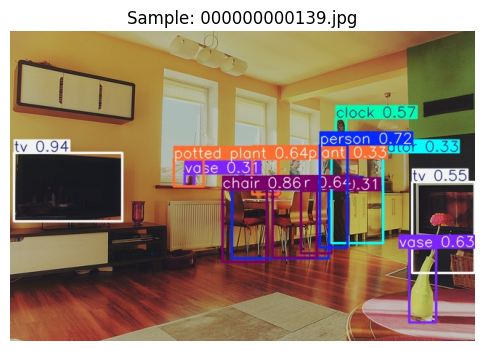

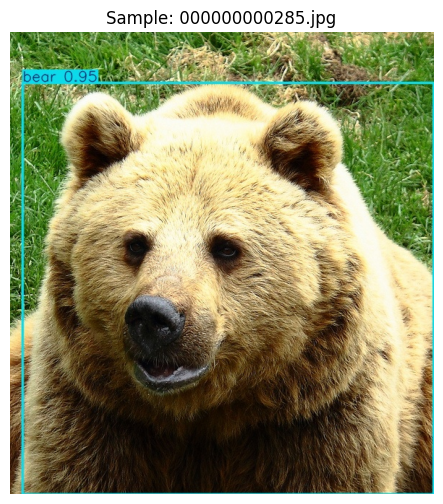

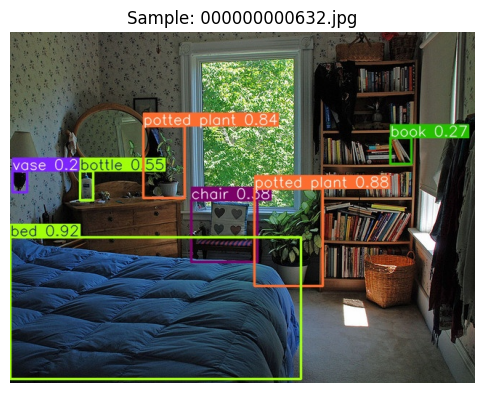

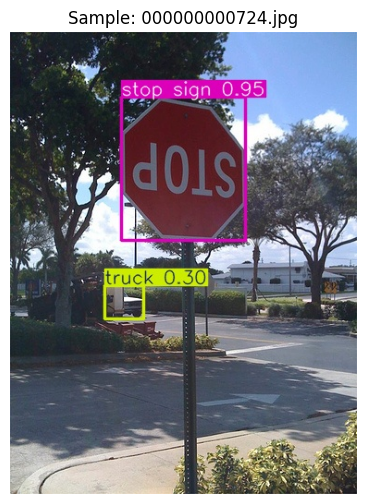

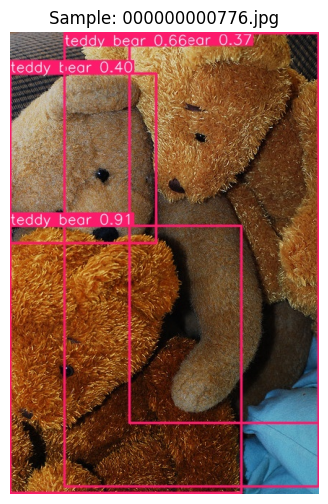

...

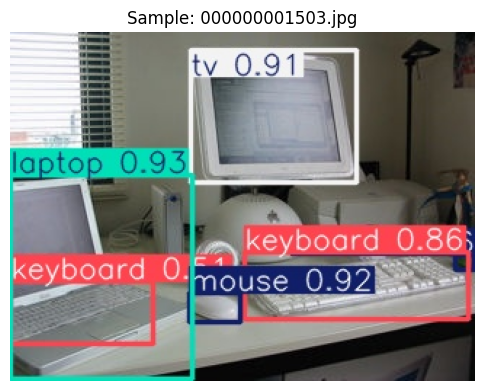

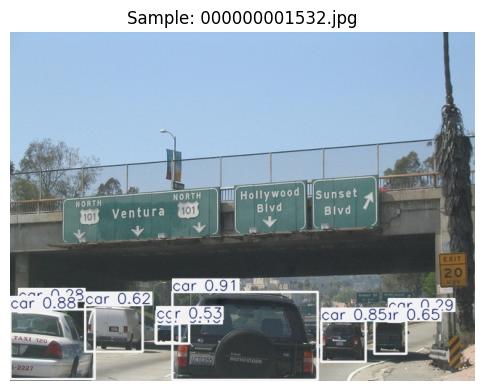

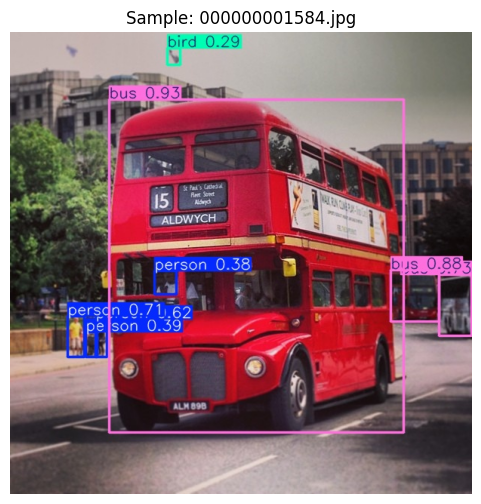

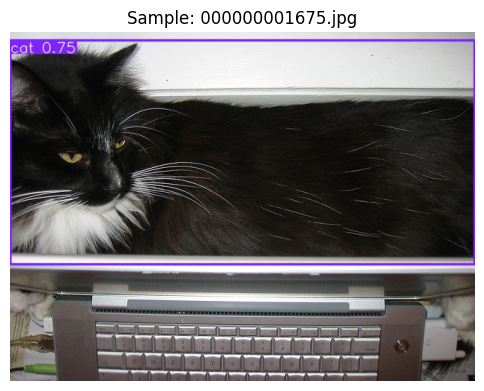

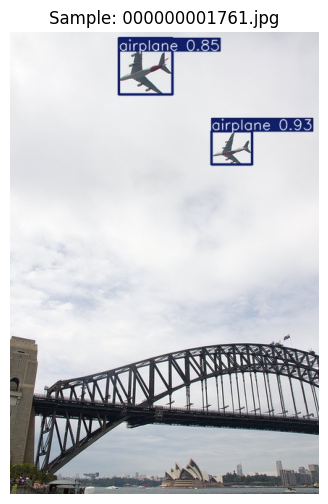

In [7]:
img_dir = "/kaggle/working/yolo11_inference/val2017_preds"

# Pick some images
files = sorted([f for f in os.listdir(img_dir) 
                if f.lower().endswith(('.png', '.jpg', '.jpeg'))])[:20]

# Display each as its own figure
for fname in files:
    img_path = os.path.join(img_dir, fname)
    img = Image.open(img_path)
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Sample: {fname}")
    plt.show()

In [8]:
# Load COCO ground truth
coco_gt = COCO(ANNOT_PATH)
img_ids = coco_gt.getImgIds()

loading annotations into memory...
Done (t=1.26s)
creating index...
index created!


In [9]:
print(img_ids[:5])
print(len(img_ids))

[397133, 37777, 252219, 87038, 174482]
5000


In [10]:
COCO80_CATEGORY_IDS = [
    1,  2,  3,  4,  5,  6,  7,  8,  9, 10,
    11, 13, 14, 15, 16, 17, 18, 19, 20, 21,
    22, 23, 24, 25, 27, 28, 31, 32, 33, 34,
    35, 36, 37, 38, 39, 40, 41, 42, 43, 44,
    46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
    56, 57, 58, 59, 60, 61, 62, 63, 64, 65,
    67, 70, 72, 73, 74, 75, 76, 77, 78, 79,
    80, 81, 82, 84, 85, 86, 87, 88, 89, 90
]

In [11]:
# Parse per-image .txt files
coco_results = []
for img_id in tqdm(img_ids, desc="Converting txt→JSON"):
    info = coco_gt.loadImgs(img_id)[0]
    txt_file = PRED_DIR / info['file_name'].replace(".jpg", ".txt")
    if not txt_file.exists():
        continue
    W, H = info['width'], info['height']
    with open(txt_file) as f:
        for line in f:
            cls, x_c, y_c, w, h, conf = map(float, line.split())
            # convert normalized center‐format to [x,y,width,height]
            x1 = (x_c - w/2) * W
            y1 = (y_c - h/2) * H
            bbox = [x1, y1, w * W, h * H]
            coco_results.append({
                "image_id": img_id,
                "category_id": COCO80_CATEGORY_IDS[int(cls)],
                "bbox": bbox,
                "score": conf
            })

Converting txt→JSON: 100%|██████████| 5000/5000 [00:00<00:00, 13604.95it/s]


In [12]:
print(len(coco_results))
print(coco_results[:5])

26932
[{'image_id': 397133, 'category_id': 1, 'bbox': [385.46752, 69.23249899999999, 113.43871999999999, 279.653402], 'score': 0.912039}, {'image_id': 397133, 'category_id': 51, 'bbox': [32.64864, 342.07759949999996, 67.52448, 42.882329], 'score': 0.723644}, {'image_id': 397133, 'category_id': 51, 'bbox': [154.987168, 168.6177738, 27.437504, 15.535626399999998], 'score': 0.700791}, {'image_id': 397133, 'category_id': 79, 'bbox': [0.04671999999999343, 187.8755165, 195.9872, 105.230307], 'score': 0.699464}, {'image_id': 397133, 'category_id': 79, 'bbox': [488.84544, 200.7188225, 129.1712, 144.454527], 'score': 0.649994}]


In [13]:
# Write out the JSON
with open(OUTPUT_JSON, "w") as f:
    json.dump(coco_results, f)
print(f"Saved {len(coco_results)} predictions → {OUTPUT_JSON}")

Saved 26932 predictions → /kaggle/working/yolo11_preds.json


In [14]:
# Run COCOeval
coco_dt = coco_gt.loadRes(OUTPUT_JSON)
evaluator = COCOeval(coco_gt, coco_dt, iouType='bbox')
evaluator.params.imgIds = img_ids   # evaluate on the same set
evaluator.evaluate()                # run per-image matching
evaluator.accumulate()              # accumulate stats
evaluator.summarize()               # print mAP, AP@.50, etc.

Loading and preparing results...
DONE (t=0.39s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=14.52s).
Accumulating evaluation results...
DONE (t=2.10s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.333
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.446
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.367
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.134
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.364
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.517
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.273
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.383
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.387
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

In [15]:
def evaluate_iou_greedy(results_json, coco_gt):
    with open(results_json, "r") as f:
        results = json.load(f)

    preds_by_image = defaultdict(list)
    for pred in results:
        preds_by_image[pred["image_id"]].append(pred)

    iou_scores = []
    image_ids = list(preds_by_image.keys())

    for image_id in image_ids:
        preds = preds_by_image[image_id]
        pred_boxes = [pred["bbox"] for pred in preds]
        if len(pred_boxes) == 0:
            continue
        pred_boxes = torch.tensor(pred_boxes, dtype=torch.float32)
        pred_boxes_xyxy = pred_boxes.clone()
        pred_boxes_xyxy[:, 2] += pred_boxes_xyxy[:, 0]
        pred_boxes_xyxy[:, 3] += pred_boxes_xyxy[:, 1]

        ann_ids = coco_gt.getAnnIds(imgIds=image_id)
        anns = coco_gt.loadAnns(ann_ids)
        gt_boxes = [ann["bbox"] for ann in anns]
        if len(gt_boxes) == 0:
            continue
        gt_boxes = torch.tensor(gt_boxes, dtype=torch.float32)
        gt_boxes_xyxy = gt_boxes.clone()
        gt_boxes_xyxy[:, 2] += gt_boxes_xyxy[:, 0]
        gt_boxes_xyxy[:, 3] += gt_boxes_xyxy[:, 1]

        ious = box_iou(gt_boxes_xyxy, pred_boxes_xyxy)
        max_ious, _ = ious.max(dim=1)
        iou_scores.extend(max_ious.cpu().numpy())
    
    mean_iou = np.mean(iou_scores) if iou_scores else 0.0
    boxes_count = len(iou_scores)
    return boxes_count, mean_iou

boxes_count, iou = evaluate_iou_greedy(OUTPUT_JSON, coco_gt)
print(f"Number of boxes: {boxes_count}")
print(f"Mean IoU = {iou:.4f}")

Number of boxes: 36574
Mean IoU = 0.5051


In [16]:
def evaluate_iou_hungarian(results_json, coco_gt):
    with open(results_json, "r") as f:
        results = json.load(f)

    preds_by_image = defaultdict(list)
    for pred in results:
        preds_by_image[pred["image_id"]].append(pred)

    iou_scores = []
    image_ids = list(preds_by_image.keys())

    for image_id in image_ids:
        preds = preds_by_image[image_id]
        pred_boxes = [pred["bbox"] for pred in preds]
        if len(pred_boxes) == 0:
            continue
        pred_boxes = torch.tensor(pred_boxes, dtype=torch.float32)
        pred_boxes_xyxy = pred_boxes.clone()
        pred_boxes_xyxy[:, 2] += pred_boxes_xyxy[:, 0]
        pred_boxes_xyxy[:, 3] += pred_boxes_xyxy[:, 1]

        ann_ids = coco_gt.getAnnIds(imgIds=image_id)
        anns = coco_gt.loadAnns(ann_ids)
        gt_boxes = [ann["bbox"] for ann in anns]
        if len(gt_boxes) == 0:
            continue
        gt_boxes = torch.tensor(gt_boxes, dtype=torch.float32)
        gt_boxes_xyxy = gt_boxes.clone()
        gt_boxes_xyxy[:, 2] += gt_boxes_xyxy[:, 0]
        gt_boxes_xyxy[:, 3] += gt_boxes_xyxy[:, 1]

        ious = box_iou(gt_boxes_xyxy, pred_boxes_xyxy).cpu().numpy()
        if ious.size == 0:
            continue

        # Hungarian matching (maximize IoU, so minimize -IoU)
        cost_matrix = -ious
        row_ind, col_ind = linear_sum_assignment(cost_matrix)
        matched_ious = ious[row_ind, col_ind]
        iou_scores.extend(matched_ious)

    mean_iou = np.mean(iou_scores) if iou_scores else 0.0
    boxes_count = len(iou_scores)
    return boxes_count, mean_iou

boxes_count, iou = evaluate_iou_hungarian(OUTPUT_JSON, coco_gt)
print(f"Number of boxes: {boxes_count}")
print(f"Mean IoU (Hungarian) = {iou:.4f}")

Number of boxes: 25116
Mean IoU (Hungarian) = 0.6913


In [17]:
def visualize_yolo_feature_maps_and_boxes(
    img_path, model, device, layer_idxs=[4, 8, 16], threshold=0.5
):
    # Register hooks to get feature maps
    feature_maps = {}
    hooks = []
    def get_activation(idx):
        def hook(module, input, output):
            feature_maps[idx] = output.detach().cpu()
        return hook
    for idx in layer_idxs:
        hooks.append(model.model.model[idx].register_forward_hook(get_activation(idx)))

    # Load and preprocess image
    im = Image.open(img_path).convert('RGB')
    orig_w, orig_h = im.size
    input_size = 640
    transform = transforms.Compose([
        transforms.Resize((input_size, input_size)),
        transforms.ToTensor(),
    ])
    img_resized = transform(im).unsqueeze(0).to(device)

    # Forward pass
    with torch.no_grad():
        results = model(img_resized)
    for h in hooks:
        h.remove()

    # Extract predictions
    try:
        preds = results[0].boxes  # Ultralytics YOLOv8
    except AttributeError:
        preds = results[0]        # fallback for older

    boxes = preds.xyxy.cpu().numpy()        # [N, 4], x1,y1,x2,y2 IN 640x640 space
    scores = preds.conf.cpu().numpy()
    labels = preds.cls.cpu().numpy()

    # Threshold and rescale coordinates to original image
    mask = scores >= threshold
    boxes = boxes[mask]
    scores = scores[mask]
    labels = labels[mask]

    # Scale boxes to original image size
    scale_w = orig_w / input_size
    scale_h = orig_h / input_size
    boxes_scaled = boxes.copy()
    boxes_scaled[:, [0, 2]] *= scale_w
    boxes_scaled[:, [1, 3]] *= scale_h

    # Plot feature maps from selected layers
    plt.figure(figsize=(len(layer_idxs) * 5, 4))
    for i, idx in enumerate(layer_idxs):
        fmap = feature_maps[idx][0]          # [C, H, W]
        fmap_mean = fmap.mean(0)
        plt.subplot(1, len(layer_idxs), i+1)
        plt.imshow(fmap_mean, cmap='viridis')
        plt.title(f"Feature map mean: Layer {idx}")
        plt.axis('off')
    plt.show()

    # Show predicted boxes on original image
    fig, axs = plt.subplots(1, 2, figsize=(18, 9))
    axs[0].imshow(im)
    ax = axs[0]
    for box, score in zip(boxes_scaled, scores):
        x1, y1, x2, y2 = box
        w, h = x2 - x1, y2 - y1
        rect = patches.Rectangle((x1, y1), w, h, linewidth=2, edgecolor="r", facecolor="none")
        ax.add_patch(rect)
        ax.text(
            x1, y1, f"{score:.2f}",
            color="white", fontsize=8,
            bbox=dict(facecolor="red", alpha=0.5)
        )
    ax.axis("off")
    ax.set_title("Predicted bounding boxes")

    # Overlay last layer's mean feature map as heatmap on original image
    fmap = feature_maps[layer_idxs[-1]][0]
    fmap_mean = fmap.mean(0).numpy()
    heatmap = (fmap_mean - fmap_mean.min()) / (fmap_mean.max() - fmap_mean.min() + 1e-8)
    heatmap_resized = np.array(
        Image.fromarray((heatmap * 255).astype(np.uint8)).resize(im.size, resample=Image.BILINEAR)
    ) / 255.0

    axs[1].imshow(im)
    axs[1].imshow(heatmap_resized, cmap='jet', alpha=0.5)
    axs[1].axis('off')
    axs[1].set_title(f"Feature map heatmap: layer {layer_idxs[-1]}")

    plt.tight_layout()
    plt.show()


0: 640x640 4 chairs, 3 potted plants, 2 tvs, 1 clock, 3 vases, 169.7ms
Speed: 0.0ms preprocess, 169.7ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/yolo11_inference/val2017_preds
4910 labels saved to /kaggle/working/yolo11_inference/val2017_preds/labels


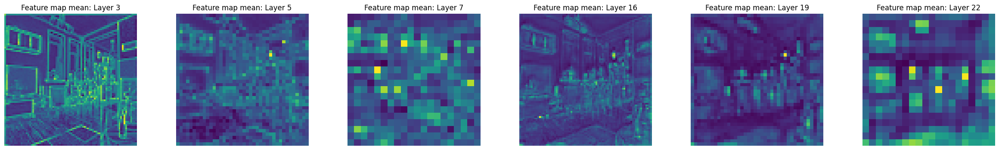

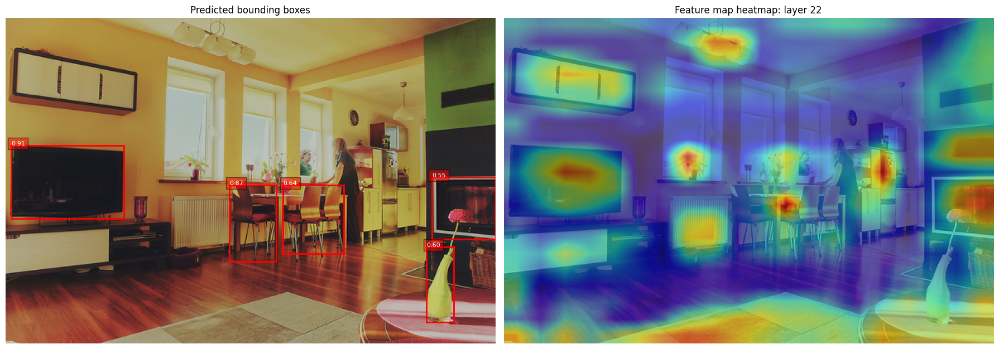

In [18]:
img_path = '/kaggle/input/coco-2017-dataset/coco2017/val2017/000000000139.jpg'
visualize_yolo_feature_maps_and_boxes(
    img_path, model, device, layer_idxs=[3, 5, 7, 16, 19, 22], threshold=0.5
)